<img src= "https://raw.githubusercontent.com/e-sensing/sits/master/inst/extdata/sticker/sits_sticker.png" align="left" width="64"/>
<img src="https://raw.githubusercontent.com/brazil-data-cube/code-gallery/master/img/logo-bdc.png" align="right" width="64" />

# <span align="center" style="color:#336699" >Creating data cubes in <b>sits</b></span>
<hr style="border:2px solid #0077b9;">

<div style="text-align: left;">
    <a href="https://nbviewer.jupyter.org/github/brazil-data-cube/code-gallery/blob/master/jupyter/R/sits/sits-timeseries-classification.ipynb"><img src="https://raw.githubusercontent.com/jupyter/design/master/logos/Badges/nbviewer_badge.svg" align="center"/></a>
</div>

<br/>

<div style="text-align: center;font-size: 90%;">
    Rolf Simoes<sup><a href="https://orcid.org/0000-0003-0953-4132"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Felipe Souza<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Gilberto Camara<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/><br/>
    Earth Observation and Geoinformatics Division, National Institute for Space Research (INPE)
    <br/>
    Avenida dos Astronautas, 1758, Jardim da Granja, São José dos Campos, SP 12227-010, Brazil
    <br/><br/>
    Contact: <a href="mailto:brazildatacube@inpe.br">brazildatacube@inpe.br</a>
    <br/><br/>
    Last Update: March 29, 2023
</div>

<br/>

<div style="text-align: justify;  margin-left: 15%; margin-right: 15%;">
<b>Abstract</b><br>
    <b>sits</b> is an open-source R package for satellite image time series analysis. The package supports the application of machine learning techniques for classification image time series obtained from data cubes. This Jupyter Notebook shows how to work with data cubes in <b>sits</b>. This notebook corresponds to the chapter "Earth Observation Data Cubes" in the <a href="https://e-sensing.github.io/sitsbook/" target="_blank"> book on the SITS package</a>.
</div>    

<br/>
<div style="text-align: justify;  margin-left: 15%; margin-right: 15%;font-size: 100%; border-style: solid; border-color: #0077b9; border-width: 1px; padding: 5px;">
    <b>For a comprehensive sits overview and discussion, please, refer to the following gihub book:</b>
    <div style="margin-left: 10px; margin-right: 10px">
    Simoes, R; Camara, G.; Souza, F.; Santos, L.; Andrade, P.; Carvalho, A.; Ferreira, K.; Queiroz, G. <a href="https://e-sensing.github.io/sitsbook/" target="_blank">sits: Satellite Image Time Series</a>.
    </div>
</div>

## Setup
<hr style="border:1px solid #0077b9;">

In [1]:
# install sits and sitsdata packages
system("cp -u -R ../input/sits-bundle/sits-bundle/* /usr/local/lib/R/site-library/")

In [2]:
# update ca-certificates
system("apt update && apt install ca-certificates")

In [3]:
library(sits)
library(sitsdata)

SITS - satellite image time series analysis.

Loaded sits v1.3.0.
        See ?sits for help, citation("sits") for use in publication.
        Documentation avaliable in https://e-sensing.github.io/sitsbook/.

Loaded sitsdata data sets v0.4.4. Use citation("sitsdata") for use in publication.



## Image data cubes as the basis for big Earth observation data analysis
<hr style="border:1px solid #0077b9;">

As of version 1.1.0, sits supports access to the following ARD image collections:

1. Amazon Web Services (AWS): Open data Sentinel-2/2A level 2A collections for the Earth’s land surface.
2. Brazil Data Cube (BDC): Open data collections of Sentinel-2/2A, Landsat-8, CBERS-4/4A, and MODIS images for Brazil. These collections organized as regular data cubes.
3. Digital Earth Africa (DEA): Open data collections of Sentinel-2/2A and Landsat-8 for Africa.
4. Microsoft Planetary Computer (MPC): Open data collections of Sentinel-2/2A and Landsat-4/5/7/8/9 for the Earth’s land areas.
5. USGS: Landsat-4/5/7/8/9 collections available in AWS, which require payment to access.
6. Swiss Data Cube (SDC): Open data collection of Sentinel-2/2A and Landsat-8 images for Switzerland.

## Regular image data cubes
<hr style="border:1px solid #0077b9;">

A *data cube* should meet the following definition:

1. A data cube is a four-dimensional structure with dimensions x (longitude or easting), y (latitude or northing), time, and bands.
2. Its spatial dimensions refer to a single spatial reference system (SRS). Cells of a data cube have a constant spatial size with respect to the cube’s SRS.
3. The temporal dimension is composed of a set of continuous and equally-spaced intervals. 
4. For every combination of dimensions, a cell has a single value.
 
![](https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/datacube_conception.png)


## Creating data cubes
<hr style="border:1px solid #0077b9;">


### Assessing Amazon Web Services

In [24]:
sits_list_collections("MPC")

MPC:
- LANDSAT-C2-L2 (LANDSAT/TM-ETM-OLI)
- bands: BLUE GREEN RED NIR08 SWIR16 SWIR22 CLOUD
- opendata collection 

- SENTINEL-2-L2A (SENTINEL-2/MSI)
- bands: B01 B02 B03 B04 B05 B06 B07 B08 B8A B09 B11 B12 CLOUD
- opendata collection 



In [23]:
#?sits_cube

In [4]:
# create a data cube covering an area in the Brazilian Amazon
# Sentinel-2 images over the Rondonia region
s2_20LKP_cube <- sits_cube(
  source     = "AWS",
  collection = "SENTINEL-S2-L2A-COGS",
  tiles      = "20LKP",
  bands      = c("B04", "B08", "B11", "CLOUD"),
  start_date = "2018-07-12",
  end_date   = "2019-07-28"
)

  |======================================================================| 100%


### Assessing Microsoft’s Planetary Computer

  |======================================================================| 100%


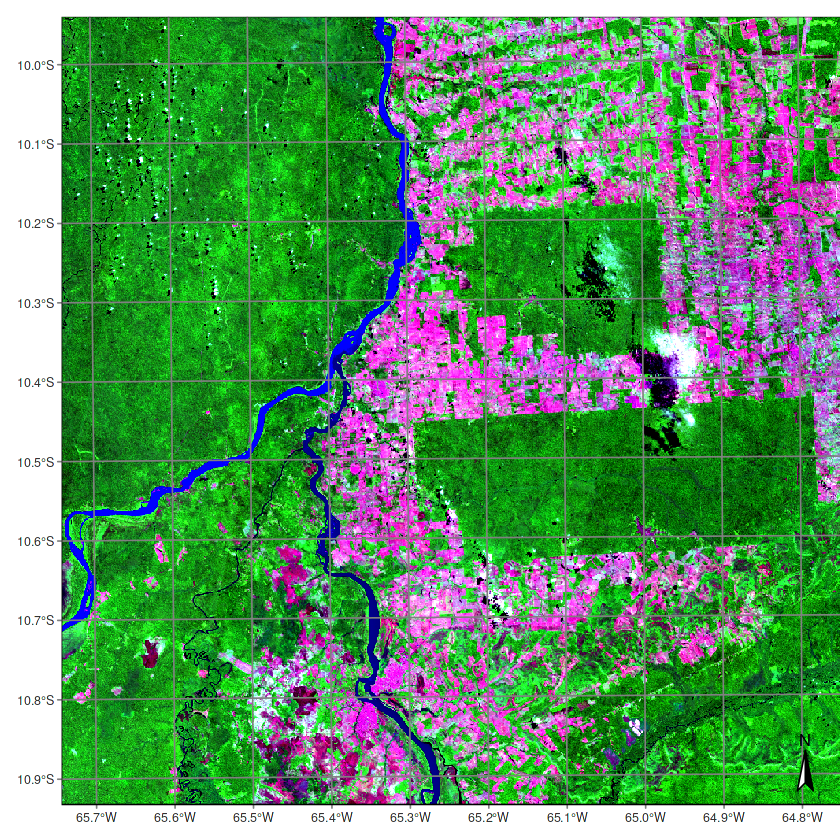

In [5]:
# create a data cube covering an area in the Brazilian Amazon
s2_20LKP_cube_MPC <- sits_cube(
  source     = "MPC",
  collection = "SENTINEL-2-L2A",
  tiles      = "20LKP",
  bands      = c("B05", "B8A", "B11", "CLOUD"),
  start_date = "2019-07-01",
  end_date   = "2019-07-28"
)

# plot a color composite of one date of the cube
plot(s2_20LKP_cube_MPC,
  red = "B11", blue = "B05", green = "B8A", date = "2019-07-18"
)

  |======================================================================| 100%


stars object downsampled to 1023 by 976 cells. See tm_shape manual (argument raster.downsample)



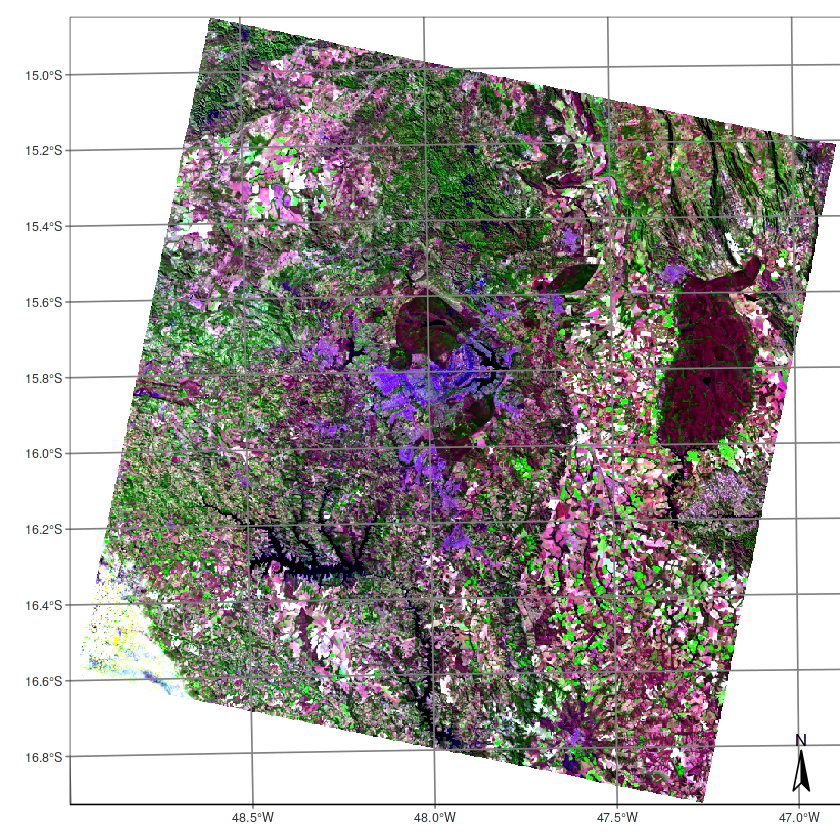

In [6]:
# bounding box of Brasilia city
bbox <- list(
  xmin = -48.2395, 
  ymin = -16.0252, 
  xmax = -47.6814, 
  ymax = -15.4433, 
  crs  = "EPSG:4326"
)

# select the cube
s2_L8_cube_MPC <- sits_cube(
  source     = "MPC",
  collection = "LANDSAT-C2-L2",
  bands      = c("BLUE", "NIR08", "SWIR16", "CLOUD"),
  roi        = bbox,
  start_date = "2019-06-01",
  end_date   = "2019-10-01"
)

# Plot the second tile that covers Brasilia
plot(s2_L8_cube_MPC, red = "SWIR16", green = "NIR08", blue = "BLUE", 
     date = "2019-07-30")

In [7]:
print(s2_L8_cube_MPC$file_info[[1]])

# A tibble: 60 × 13
   fid     date       band   xres  yres  xmin    ymin   xmax    ymax nrows ncols
   <chr>   <date>     <chr> <dbl> <dbl> <dbl>   <dbl>  <dbl>   <dbl> <dbl> <dbl>
 1 LE07_L… 2019-06-04 BLUE     30    30 67485 -1.86e6 309315 -1.66e6  6891  8061
 2 LE07_L… 2019-06-04 CLOUD    30    30 67485 -1.86e6 309315 -1.66e6  6891  8061
 3 LE07_L… 2019-06-04 NIR08    30    30 67485 -1.86e6 309315 -1.66e6  6891  8061
 4 LE07_L… 2019-06-04 SWIR…    30    30 67485 -1.86e6 309315 -1.66e6  6891  8061
 5 LC08_L… 2019-06-12 BLUE     30    30 71085 -1.88e6 298215 -1.65e6  7691  7571
 6 LC08_L… 2019-06-12 CLOUD    30    30 71085 -1.88e6 298215 -1.65e6  7691  7571
 7 LC08_L… 2019-06-12 NIR08    30    30 71085 -1.88e6 298215 -1.65e6  7691  7571
 8 LC08_L… 2019-06-12 SWIR…    30    30 71085 -1.88e6 298215 -1.65e6  7691  7571
 9 LE07_L… 2019-06-20 BLUE     30    30 66585 -1.86e6 308115 -1.66e6  6891  8051
10 LE07_L… 2019-06-20 CLOUD    30    30 66585 -1.86e6 308115 -1.66e6  6891  8051
# … with

In [26]:
#s2_L8_cube_MPC$file_info[[1]][, c("cloud_cover", "path")]

### Assessing the Brazil Data Cube

In [8]:
# To access the Brazil Data Cube, users need to provide 
# their credentials using an environment variables, as 
# shown below. Obtaining a BDC access key is free. 
# Users need to register at the BDC site to obtain the key.
Sys.setenv("BDC_ACCESS_KEY" = "change-me")

In [31]:
mato_grosso_shp <- system.file("extdata/shapefiles/mato_grosso/mt.shp", package = "sits")
roi_sf <- sf::st_read(mato_grosso_shp)

Reading layer `mt' from data source 
  `/usr/local/lib/R/site-library/sits/extdata/shapefiles/mato_grosso/mt.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 1 feature and 3 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -61.63284 ymin: -18.03993 xmax: -50.22481 ymax: -7.349034
Geodetic CRS:  SIRGAS 2000


In [33]:
modis_cube <- sits_cube(
    source = "BDC",
    collection = "MOD13Q1-6",
    roi = roi_sf,
    bands = c("NDVI", "EVI", "CLOUD"),
    start_date = "2019-01-01",
    end_date = "2019-10-01"
)

  |======================================================================| 100%


In [ ]:
print(modis_cube)

  |======================================================================| 100%


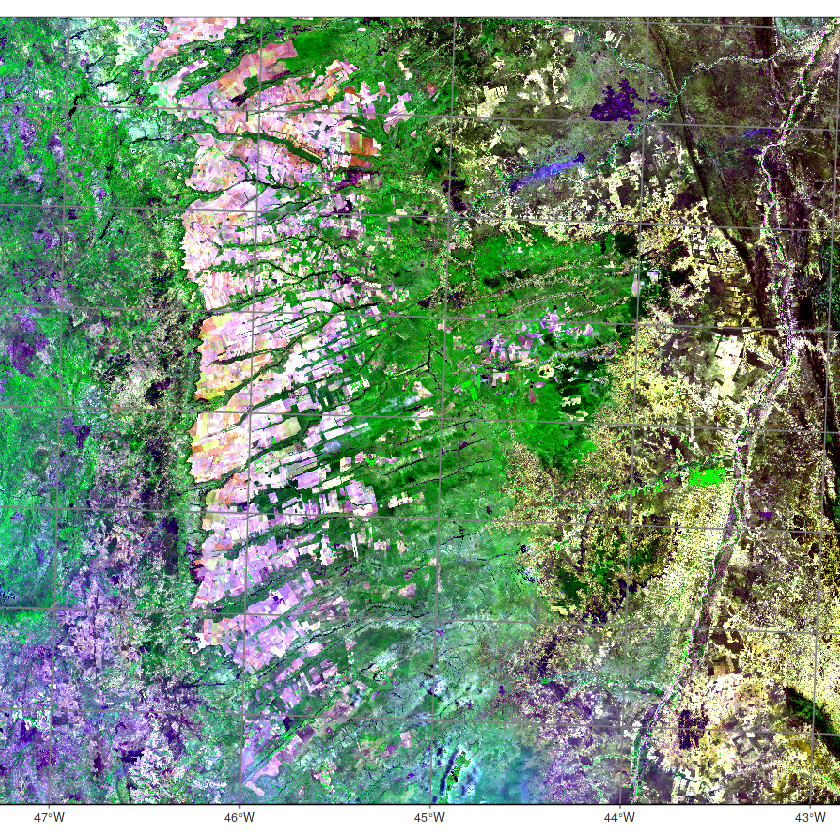

In [9]:
# define a tile from the CBERS-4/4A AWFI collection
cbers_tile <- sits_cube(
  source     = "BDC",
  collection = "CB4_64_16D_STK-1",
  tiles      = "022024",
  bands      = c("B13", "B14", "B15", "B16", "CLOUD"),
  start_date = "2018-09-01",
  end_date   = "2019-08-28"
)

# plot one time instance
plot(cbers_tile, red = "B15", green = "B16", blue = "B13", 
     date = "2018-09-30")

### Defining a data cube using ARD local files

In [10]:
# Create a cube based on a stack of CBERS data
data_dir <- system.file("extdata/CBERS", package = "sitsdata")
# list the first file
list.files(data_dir)[1]

[1] "CB4_64_16D_STK_022024_2018-08-29_2018-09-13_EVI.tif"

  |======================================================================| 100%


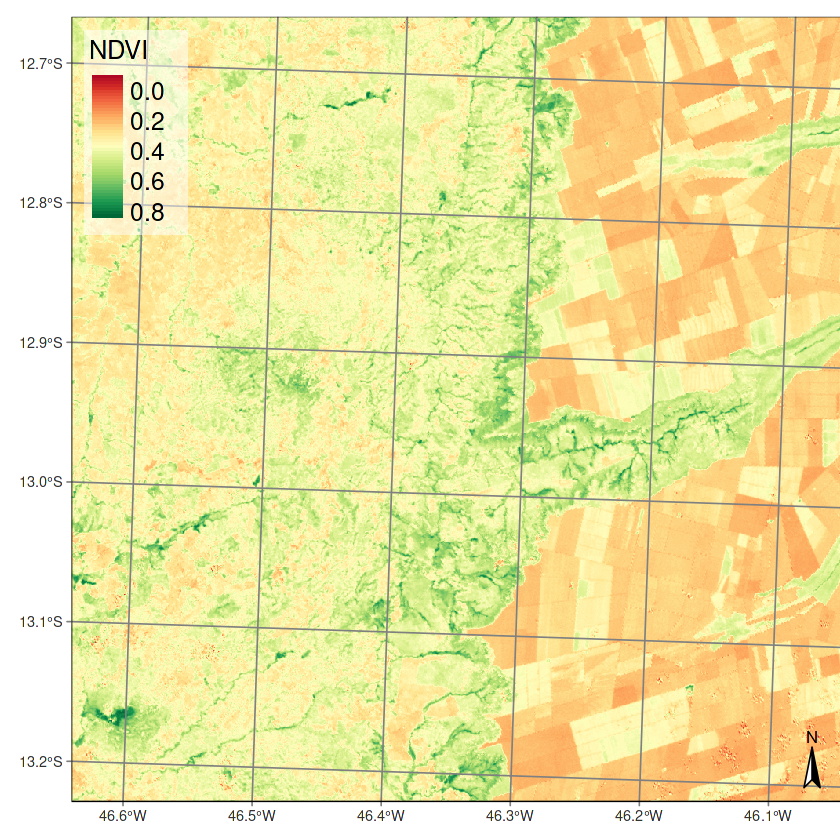

In [11]:
# create a data cube from local files
cbers_cube <- sits_cube(
  source     = "BDC",
  collection = "CB4_64_16D_STK-1",
  data_dir   = data_dir,
  parse_info = c("X1", "X2", "X3", "X4", "tile", "date", "X5", "band")
)

# plot the band NDVI in the first time instance
plot(cbers_cube, band = "NDVI", date = "2018-08-29")

In [35]:
#?sits_cube_copy

### Defining a data cube using classified images

  |======================================================================| 100%


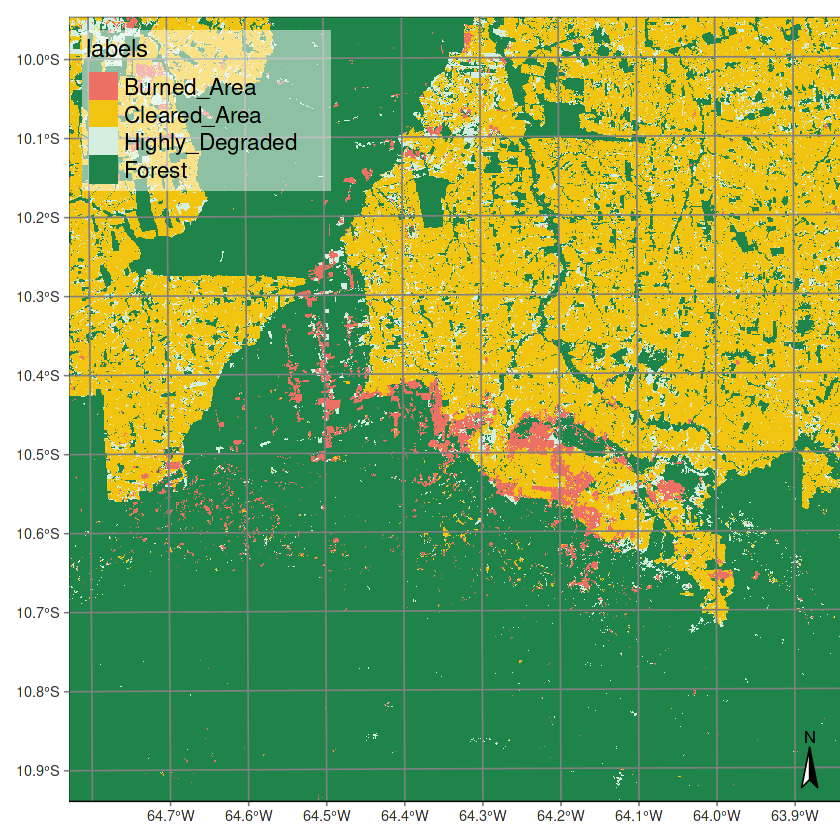

In [12]:
# Create a cube based on a classified image
data_dir <- system.file("extdata/Rondonia-20LLP", package = "sitsdata")
# file is named "SENTINEL-2_MSI_20LLP_2020-06-04_2021-08-26_class_v1.tif"

rondonia_class_cube <- sits_cube(
  source     = "AWS",
  collection = "SENTINEL-S2-L2A-COGS",
  bands      = "class",
  labels     = c("Burned_Area", "Cleared_Area", "Highly_Degraded", "Forest"),
  data_dir   = data_dir,
  parse_info = c(
    "X1", "X2", "tile", "start_date", "end_date", "band", "version"
  )
)

# plot the classified cube
plot(rondonia_class_cube)

## Regularizing data cubes
<hr style="border:1px solid #0077b9;">

  |======================================================================| 100%


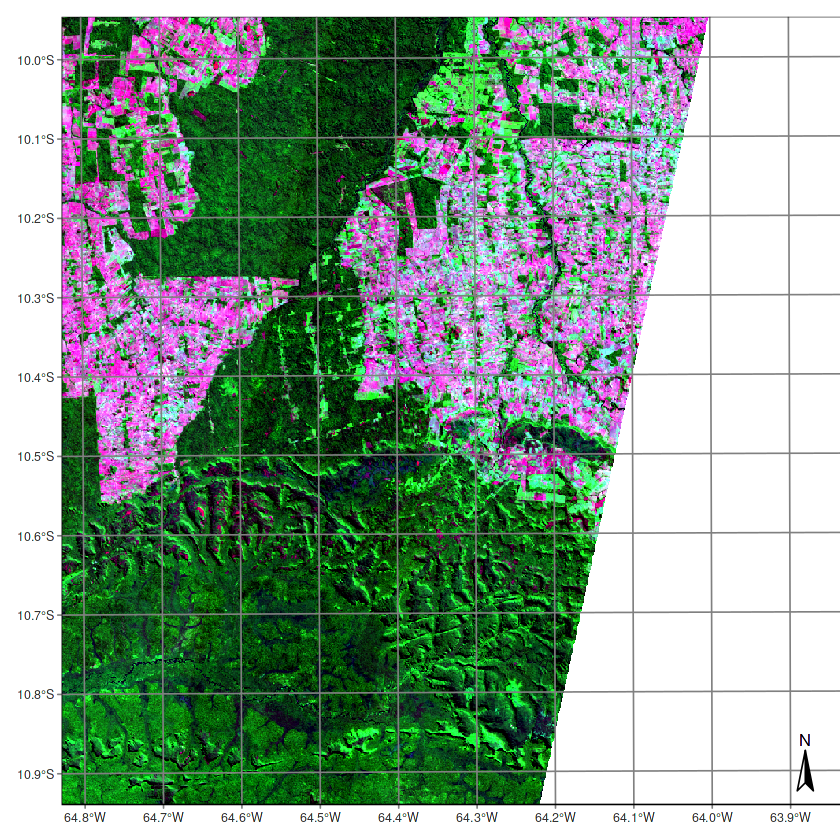

In [13]:
# creating an irregular data cube from AWS
s2_cube <- sits_cube(
  source     = "AWS",
  collection = "SENTINEL-S2-L2A-COGS",
  tiles      = "20LLP",
  bands      = c("B05", "B8A", "B12", "CLOUD"),
  start_date = "2018-07-01",
  end_date   = "2018-08-31"
)

# plot the first image of the irregular cube
plot(s2_cube, red = "B12", green = "B8A", blue = "B05", date = "2018-07-03")

Warning message:
“Regularization works better when data store locally. Please, use 'sits_cube_copy()' to copy data locally before regularization”


  |======================================================================| 100%


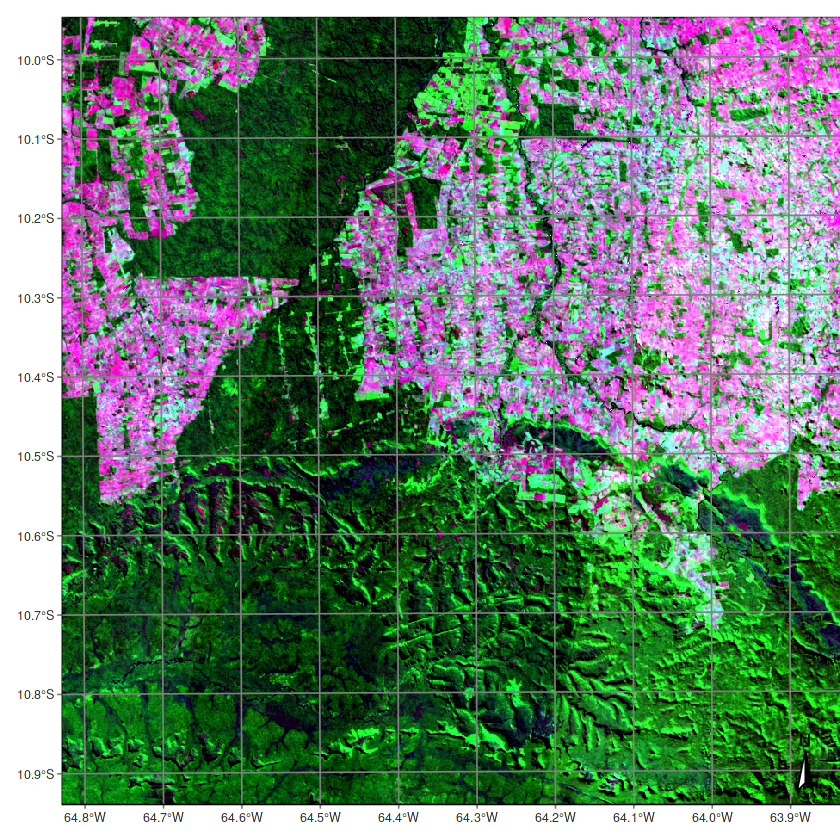

In [14]:
# regularize the cube to 15 day intervals
reg_cube <- sits_regularize(
  cube       = s2_cube,
  output_dir = getwd(),
  res        = 120,
  period     = "P16D",
  multicores = 4
)

# plot the first image of the tile 20LLP of the regularized cube
# The pixels of the regular data cube cover the full MGRS tile
plot(reg_cube, red = "B12", green = "B8A", blue = "B05")

In [36]:
sits_timeline(s2_cube)

[1] "2018-07-03" "2018-07-05" "2018-07-08" "2018-07-10" "2018-07-13"
 [6] "2018-07-15" "2018-07-18" "2018-07-20" "2018-07-23" "2018-07-25"
[11] "2018-07-28" "2018-07-30" "2018-08-02" "2018-08-04" "2018-08-07"
[16] "2018-08-09" "2018-08-12" "2018-08-14" "2018-08-17" "2018-08-19"
[21] "2018-08-22" "2018-08-24" "2018-08-27" "2018-08-29"

In [15]:
sits_timeline(reg_cube)

[1] "2018-07-03" "2018-07-19" "2018-08-04" "2018-08-20"

HTML widgets cannot be represented in plain text (need html)
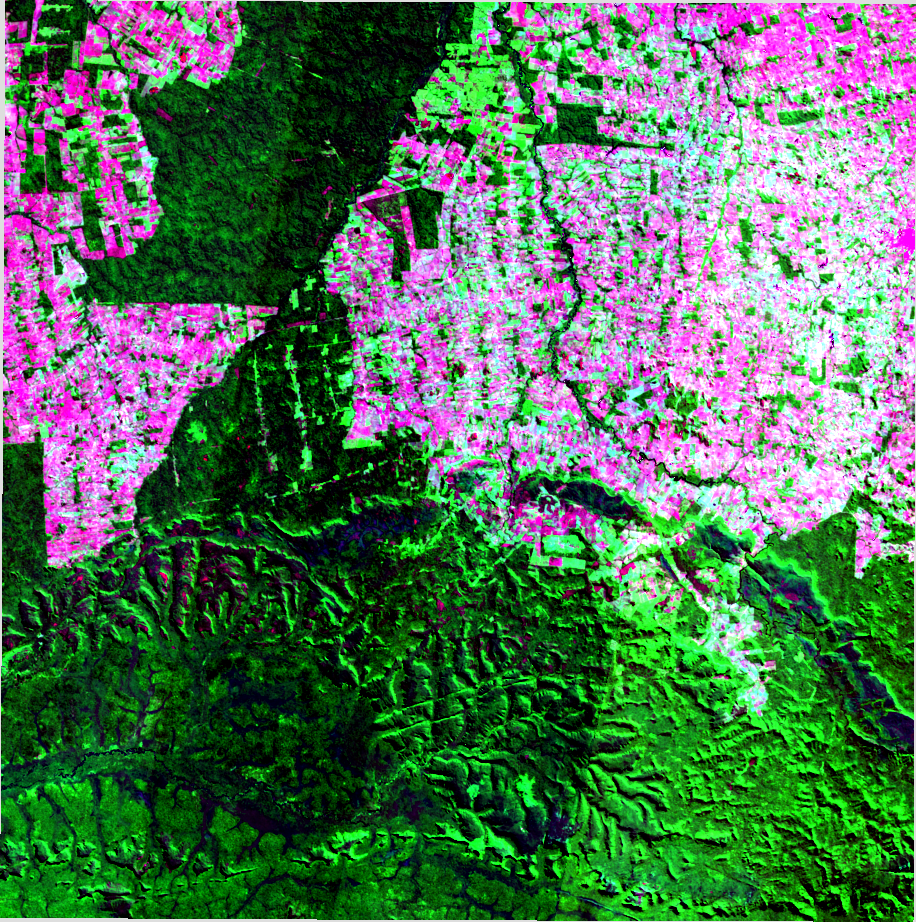

In [16]:
# plot one of the images of the cube
sits_view(reg_cube, red = "B12", green = "B8A", blue = "B05", 
          date = "2018-07-03")

## Mathematical operations on regular data cubes
<hr style="border:1px solid #0077b9;">

  |======================================================================| 100%


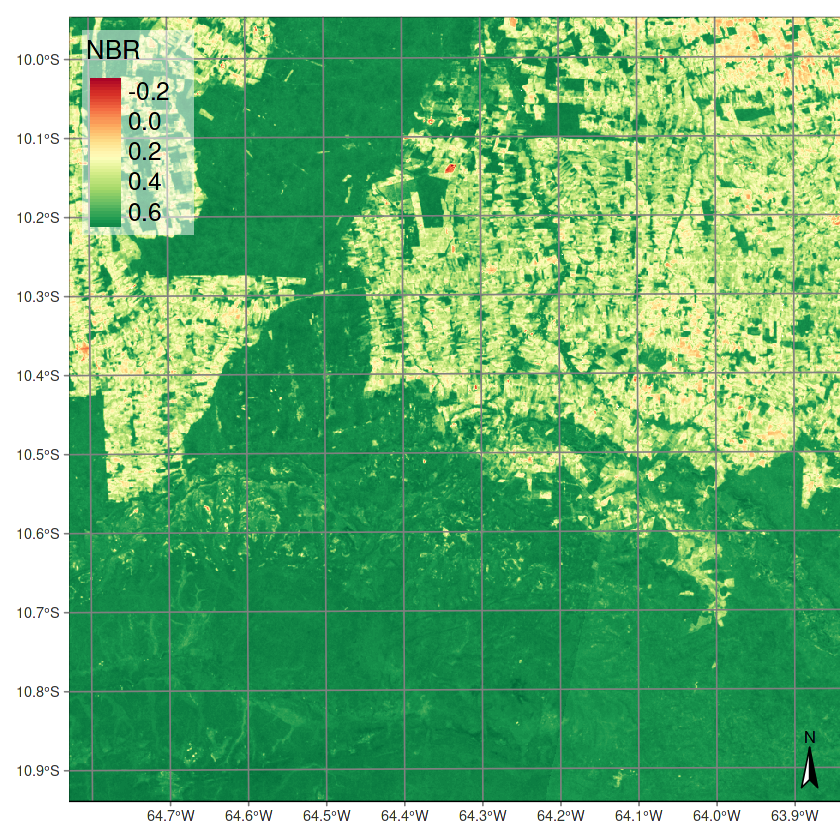

In [17]:
# calculate the normalized burn ratio
reg_cube_NBR <- sits_apply(reg_cube,
  NBR        = (B8A - B12) / (B8A + B12),
  output_dir = getwd(),
  multicores = 4,
  memsize    = 12
)
# plot the NBR for the first date
plot(reg_cube_NBR, band = "NBR")

In [37]:
sits_bands(reg_cube_NBR)

[1] "B05" "B12" "B8A" "NBR"

## List supported providers/collections
<hr style="border:1px solid #0077b9;">

In [18]:
# What collections are available in sits? 
sits_list_collections()

BDC:
- CB4_64-1 (CBERS-4/AWFI)
- bands: NDVI EVI B13 B14 B15 B16 CLOUD
- opendata collection (requires access token)

- CB4_64_16D_STK-1 (CBERS-4/AWFI)
- bands: NDVI EVI B13 B14 B15 B16 CLOUD
- opendata collection (requires access token)

- CB4MUX_20-1 (CBERS-4/MUX)
- bands: NDVI EVI B5 B6 B7 B8 CLOUD
- opendata collection (requires access token)

- CB4_20_1M_STK-1 (CBERS-4/MUX)
- bands: NDVI EVI B5 B6 B7 B8 CLOUD
- opendata collection (requires access token)

- LC8_30-1 (LANDSAT-8/OLI)
- bands: NDVI EVI B1 B2 B3 B4 B5 B6 B7 CLOUD
- opendata collection (requires access token)

- LC8_30_16D_STK-1 (LANDSAT-8/OLI)
- bands: NDVI EVI B1 B2 B3 B4 B5 B6 B7 CLOUD
- opendata collection (requires access token)

- LANDSAT-2M-1 (LANDSAT/TM-ETM-OLI)
- bands: COASTAL BLUE GREEN RED NIR08 SWIR16 SWIR22 NDVI EVI CLOUD
- opendata collection (requires access token)

- MOD13Q1-6 (TERRA/MODIS)
- bands: NDVI EVI BLUE RED NIR MIR CLOUD
- opendata collection (requires access token)

- MYD13Q1-6 (AQUA/MODIS)
